In [1]:
## Notebook to visualize and test Dist-S1 confirmation.
## Plot from confirmed product. 
## Read metric run confirmation and plot results. 

In [2]:
from pathlib import Path
import numpy as np
import numpy.ma as ma
from datetime import datetime, timedelta
import rasterio
from rasterio.windows import Window
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from typing import List, Tuple, Optional

import re

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


### Data loader function

In [3]:

def load_dist_products_from_dirs(
    base_dir: Path
) -> Tuple[List[Tuple[np.ndarray, ...]], List[np.ndarray], List[datetime]]:
    """
    Load disturbance result arrays and metrics from product directories in temporal order.

    Args:
        base_dir (Path): Path to the parent directory containing disturbance product directories.

    Returns:
        results (List[Tuple[np.ndarray, ...]]): List of result tuples (excluding metric).
        metric_arr (List[np.ndarray]): List of metric arrays, one per timestep.
        dates (List[datetime]): List of datetime objects corresponding to each timestep.
    """

    # Map logical keys to filename patterns
    pattern_map = {
        "status": "*_GEN-DIST-STATUS.tif",
        "max_metric": "*_GEN-METRIC-MAX.tif",
        "confidence": "*_GEN-DIST-CONF.tif",
        "last_date": "*_GEN-DIST-DATE.tif",
        "latest_count": "*_GEN-DIST-COUNT.tif",
        "latest_percent": "*_GEN-DIST-PERC.tif",
        "latest_duration": "*_GEN-DIST-DUR.tif",
        "last_obs": "*_GEN-DIST-LAST-DATE.tif",
        "metric": "*_GEN-METRIC.tif"
    }

    # Regex to extract the start date from the directory name
    date_pattern = re.compile(r"_(\d{8}T\d{6}Z)_")

    # Collect (dir_path, datetime) pairs
    dir_with_dates = []
    for d in base_dir.iterdir():
        if d.is_dir():
            match = date_pattern.search(d.name)
            if match:
                date_str = match.group(1)
                date_dt = datetime.strptime(date_str, "%Y%m%dT%H%M%SZ")
                dir_with_dates.append((d, date_dt))

    # Sort by datetime
    dir_with_dates.sort(key=lambda x: x[1])

    results: List[Tuple[np.ndarray, ...]] = []
    metric_arr: List[np.ndarray] = []
    dates: List[datetime] = []

    # Iterate over sorted directories
    for timestep_dir, date_dt in dir_with_dates:
        arrays = {}
        for key, glob_pattern in pattern_map.items():
            matches = list(timestep_dir.glob(glob_pattern))
            if not matches:
                raise FileNotFoundError(f"Missing {glob_pattern} in {timestep_dir}")
            tif_path = matches[0]
            with rasterio.open(tif_path) as src:
                arrays[key] = src.read(1)

        metric_arr.append(arrays["metric"])
        results.append(tuple(arrays[k] for k in pattern_map if k != "metric"))
        dates.append(date_dt)

    return results, metric_arr, dates


### Confirmation function

In [4]:
# Confirmation process.
def process_disturbance_alert(dist_metric, dist_date, previous_dist_arr_list=None):

    # Constants
    lowthresh = 2.5
    highthresh = 4.5
    nodaylimit = 30 # number of days without disturbance to finish disturbance
    consecutive_nodist = False # If True, will use nocount == 2 to finish disturbances
    percent_reset_thresh = 10 # percent of observations with spectral anomalies to reset disturbance
    nocount_reset_thresh = 7 # number of non-disturbed observations to reset disturbance
    max_obs_num_year = 253 # number for distHLS needs to be reviewed for dist-s1
    conf_upper_lim = 32000 # number for distHLS needs to be reviewed for dist-s1
    conf_thresh = 3**2 * 2.5 # Defined as N**2 * Max(metric) for dist-S1
    metric_value_upper_lim = 100 # number for distHLS needs to be reviewed for dist-s1
    base_date = datetime(2020, 12, 31) # base date for the product

    # Status codes
    NODIST, FIRSTLO, PROVLO, CONFLO, FIRSTHI, PROVHI, CONFHI, CONFLOFIN, CONFHIFIN, NODATA = range(10)
    NODATA = 255

    # Read dist-s1 metric
    currAnom = dist_metric # doing this here just for the sake of keeping variable names
    rows, cols = currAnom.shape
    currDate = (dist_date - base_date).days  # Convert date to days since base date

    # Initialize output arrays
    status = np.full((rows, cols), NODATA, dtype=np.uint8) # disturbance alert status layer, initialized to NODATA
    # max_anom = np.full((rows, cols), -1, dtype=np.int16) # max metric open question: should this be int16 or float32?
    max_anom = np.full((rows, cols), -1.0, dtype=np.float32) # max metric
    conf = np.zeros((rows, cols), dtype=np.int16) # confidence
    date = np.zeros((rows, cols), dtype=np.int16) # date of first disturbance layer (days since base_date)
    count = np.zeros((rows, cols), dtype=np.uint8) # number of observations with detected disturbance since the first detection
    percent = np.full((rows, cols), 255, dtype=np.uint8) # percent of observations with disturbance since initial detection
    dur = np.zeros((rows, cols), dtype=np.int16) # disturbance duration in days since the first detection
    lastObs = np.zeros((rows, cols), dtype=np.int16) # day of last quality accessed observation (days since base_date)

    # Check if this is the initial product or if previous data exists
    if previous_dist_arr_list is None:
        print(f"This is a first product tile with date {dist_date}")
    elif all(a is not None for a in previous_dist_arr_list):
        # Load previous product arrays
        status = previous_dist_arr_list[0]
        max_anom = previous_dist_arr_list[1]
        conf = previous_dist_arr_list[2]
        date = previous_dist_arr_list[3]
        count = previous_dist_arr_list[4]
        percent = previous_dist_arr_list[5]
        dur = previous_dist_arr_list[6]
        lastObs = previous_dist_arr_list[7]
    else:
        raise ValueError("Missing previous product data for non-first acquisitions.")

    # Valid metric mask 
    valid = currAnom >= 0

    # Reset mask (365-day timeout, or previous status is finished and current metric is above low threshold)
    reset_mask = ((currDate - date) > 365) | ((status > CONFHI) & (currAnom >= lowthresh))
    reset_mask &= valid # only reset valid pixels
    status[reset_mask] = NODIST
    percent[reset_mask] = 255 # Indicate reset or no disturbance
    count[reset_mask] = 0
    max_anom[reset_mask] = 0
    conf[reset_mask] = 0
    date[reset_mask] = 0
    dur[reset_mask] = 0

    # Compute previous no count, derived from percent
    with np.errstate(divide='ignore', invalid='ignore'): # Suppress division by zero warnings
        prevnocount = np.where(
            (percent > 0) & (percent <= 100), # Only for pixels with meaningful percent values
            ((100.0 - percent) / percent * count).astype(np.int32),
            0
        )

    # Disturbance detected in current observation (current anomaly >= low threshold and valid)
    disturbed = (currAnom >= lowthresh) & valid

    ## New disturbance detection
    # Pixels that are now disturbed but were previously NODIST or NODATA
    new_detection = disturbed & ((status == NODIST) | (status == NODATA))
    date[new_detection] = currDate # Assign current date as first disturbance date
    max_anom[new_detection] = currAnom[new_detection] # Store current anomaly as max
    percent[new_detection] = 100 # 100% of observations are disturbed
    count[new_detection] = 1 # First observation with disturbance

    ## Ongoing disturbance detection
    # Pixels that are disturbed and were not new detections
    continuing = disturbed & ~new_detection
    max_anom[continuing] = np.maximum(max_anom[continuing], currAnom[continuing]) # Update max metric
    can_increment = continuing & (count < max_obs_num_year) # Increment count for ongoing disturbances, up to max_obs_num_year
    count[can_increment] += 1 # Increment disturbance count
    # Update percent of disturbed observations
    percent[can_increment] = ((count[can_increment] * 100.0) /
                              (count[can_increment] + prevnocount[can_increment])).astype(np.uint8)

    dur[disturbed] = currDate - date[disturbed] + 1  # Update duration for disturbed pixels
    not_disturbed = (~disturbed) & valid # Track valid observations that are not disturbed (metric below low threshold)
    adjust_percent = not_disturbed & (percent > 0) & (percent <= 100) & (count < max_obs_num_year + 1) # Adjust percent for pixels where no metric is detected but were previously disturbed
    prevcount = count.copy() # Store current count
    percent[adjust_percent] = ((count[adjust_percent] * 100.0) /
                               (prevcount[adjust_percent] + prevnocount[adjust_percent] + 1)).astype(np.uint8)

    # Reset status for pixels that were NODATA and are now not disturbed
    status_reset_nodata = not_disturbed & (status == NODATA)
    status[status_reset_nodata] = NODIST
    percent[status_reset_nodata] = 255
    count[status_reset_nodata] = 0
    max_anom[status_reset_nodata] = 0
    conf[status_reset_nodata] = 0
    date[status_reset_nodata] = 0
    dur[status_reset_nodata] = 0

    # Update confidence
    update_conf = (conf > 0) & (status <= CONFHI) & valid # Pixels with ongoing disturbance and status not yet finished
    currAnomConf = np.minimum(currAnom, metric_value_upper_lim) # Apply metric_value_upper_lim (100) to current anomaly for confidence calculation
    prevmean = np.zeros_like(conf, dtype=np.float64)
    # Calculate previous mean from confidence (conf = mean * count^2)
    with np.errstate(divide='ignore', invalid='ignore'):
        prevmean[update_conf] = conf[update_conf].astype(np.float64) / (count[update_conf].astype(np.float64) ** 2)
    mean = np.zeros_like(prevmean)
    denom = count + prevnocount + 1 # Denominator for new mean calculation
    # Update mean based on previous mean and current anomaly
    with np.errstate(divide='ignore', invalid='ignore'):
        mean[update_conf] = (prevmean[update_conf] * (count[update_conf] + prevnocount[update_conf]) +
                             currAnomConf[update_conf]) / denom[update_conf]
    tempconf = (mean * count.astype(np.float64) * count.astype(np.float64)).astype(np.int32) # Calculate new confidence
    conf[update_conf] = np.clip(tempconf[update_conf], 0, conf_upper_lim) # Clip confidence to upper limit (32000)

    # Update confidence for newly detected disturbances
    new_conf_mask = ((status == NODIST) | (status == NODATA)) & disturbed
    conf[new_conf_mask] = np.minimum(currAnom[new_conf_mask], metric_value_upper_lim).astype(np.int16) # Confidence for new disturbances is the clipped current anomaly
    lastAnomDate = date + dur - 1 # Last anomaly date to be used for status updates

    # Calculate nocount: 1 if lastObs was after lastAnomDate, 1 if current anomaly is below lowthresh
    nocount = ((lastObs > lastAnomDate).astype(np.int8) +
               (currAnom < lowthresh).astype(np.int8))

    ## Status Updates
    # Apply status updates for active disturbances (FIRSTLO, PROVLO, CONFLO, FIRSTHI, PROVHI, CONFHI)
    updating_current = (status <= CONFHI) | (status == NODATA)
    # Update high status
    hi_mask = updating_current & (max_anom >= highthresh)
    conf_hi = hi_mask & (conf >= conf_thresh)
    first_hi = hi_mask & (dur == 1)
    prov_hi = hi_mask & ~(conf_hi | first_hi) & (status != CONFHI)
    status[conf_hi] = CONFHI
    status[first_hi] = FIRSTHI
    status[prov_hi] = PROVHI
    # Update low status
    lo_mask = updating_current & (max_anom >= lowthresh) & (max_anom < highthresh)
    conf_lo = lo_mask & (conf >= conf_thresh)
    first_lo = lo_mask & (dur == 1)
    prov_lo = lo_mask & ~(conf_lo | first_lo) & (status != CONFLO)
    status[conf_lo] = CONFLO
    status[first_lo] = FIRSTLO
    status[prov_lo] = PROVLO

    # Reset ongoing disturbances if max_anom drops below lowthresh
    status[updating_current & (max_anom < lowthresh)] = NODIST

    # Determine which pixels MUST FINISH, based on the current status
    status_at_finish_check = status.copy()

    # Set must_finish_conditions
    must_finish_conditions = [] # Initialize must_finish_conditions list
    # Condition A: Observation gap too large
    must_finish_conditions.append(((currDate - lastAnomDate) >= nodaylimit) & (lastAnomDate > 0))
    # Condition B: Short disturbance with low current metric
    must_finish_conditions.append((dur == 1) & (currAnom < lowthresh))
    # Condition C: Conditional nocount logic
    if consecutive_nodist:
        must_finish_conditions.append(nocount == 2)
    # Condition D: Percent below threshold
    # If the percentage of disturbed observations drops below this, it triggers a reset.
    must_finish_conditions.append(percent < percent_reset_thresh)
    # Condition E: Number of non-disturbed observations (prevnocount) below threshold
    # If the number of non-disturbed observations (prevnocount) is high, the disturbance resets.
    must_finish_conditions.append(prevnocount >= nocount_reset_thresh)

    # Combine all must_finish_conditions with OR
    if must_finish_conditions:
        combined_must_finish_criteria = np.logical_or.reduce(must_finish_conditions)
    else:
        combined_must_finish_criteria = np.full(status.shape, False, dtype=bool)

    must_finish = (status_at_finish_check <= CONFHI) & combined_must_finish_criteria
    # Apply finished status
    status[must_finish & (status_at_finish_check == CONFLO)] = CONFLOFIN
    status[must_finish & (status_at_finish_check == CONFHI)] = CONFHIFIN

    # Reset other finished pixels (those that must finish but weren't CONFLO/CONFHI) to NODIST
    reset_finish_other = must_finish & ~((status_at_finish_check == CONFLO) | (status_at_finish_check == CONFHI))
    status[reset_finish_other] = NODIST
    percent[reset_finish_other] = 0
    count[reset_finish_other] = 0
    max_anom[reset_finish_other] = 0
    conf[reset_finish_other] = 0
    date[reset_finish_other] = 0
    dur[reset_finish_other] = 0

    lastObs[valid] = currDate # Update last observation date for all valid pixels

    return status, max_anom, conf, date, count, percent, dur, lastObs

### Run confirmation usign local function

In [5]:
# Runs process_disturbance_alert for a list of metric/date pairs.
def run_metric_ts_confirmation(dist_metric_list, dist_date_list):
    """
    Runs process_disturbance_alert for a list of metric/date pairs,
    passing forward the output arrays as previous_dist_arr_list.

    Parameters:
        dist_metric_list: list of numpy arrays
        dist_date_list: list of datetime.datetime objects

    Returns:
        List of outputs for each timestep (as tuples of output arrays)
    """
    results = []
    previous = None

    for metric, date in zip(dist_metric_list, dist_date_list):
        status, max_anom, conf, ddate, count, percent, dur, lastObs = process_disturbance_alert(
            dist_metric=metric,
            dist_date=date,
            previous_dist_arr_list=previous
        )
        
        result = (
            status.copy(),
            max_anom.copy(),
            conf.copy(),
            ddate.copy(),
            count.copy(),
            percent.copy(),
            dur.copy(),
            lastObs.copy(),
        )
        results.append(result)

        previous = [arr.copy() for arr in result]

    return results


### Plotting function

In [6]:
def plot_disturbance_results_with_metric(
    results,
    metric_arr,
    subset=np.s_[:, :],
    value_ranges=None,
    panels=None,
    dates=None,
):


    # Custom status colormap
    DIST_CMAP = {
        0: (18, 18, 18, 255),
        1: (0, 85, 85, 255),
        2: (137, 127, 78, 255),
        3: (222, 224, 67, 255),
        4: (0, 136, 136, 255),
        5: (228, 135, 39, 255),
        6: (224, 27, 7, 255),
        7: (119, 119, 119, 255),
        8: (221, 221, 221, 255),
        255: (0, 0, 0, 255),
    }

    status_values = sorted(DIST_CMAP.keys())
    rgba_colors = [tuple(np.array(DIST_CMAP[val]) / 255.0) for val in status_values]
    status_cmap = mcolors.ListedColormap(rgba_colors)
    status_norm = mcolors.BoundaryNorm(boundaries=np.array(status_values + [256]), ncolors=len(status_values))

    labels = [
        "Metric",       # col 0
        "Status",       # col 1
        "Max metric",   # col 2
        "Confidence",   # col 3
        "Last date",    # col 4
        "Latest count", # col 5
        "Latest percent",#col 6
        "Latest duration",#col 7
        "Last obs",     # col 8
    ]

    if value_ranges is None:
        value_ranges = [
            (0, 10),       # Metric 
            (0, 10),       # Status
            (0, 30),       # Max metric
            (0, 100),      # Confidence
            (1000, 2000),  # Last date
            (0, 10),       # Count
            (0, 150),      # Percent
            (0, 36),       # Duration
            (1000, 2000),  # Last obs
        ]

    # If no panels specified, show all
    if panels is None:
        panels = labels
    # Convert to indices
    panel_indices = [labels.index(p) for p in panels]

    n_steps = len(results)
    n_cols = len(panel_indices)
    fig, axes = plt.subplots(n_steps, n_cols, figsize=(6 * n_cols, 2.8 * n_steps))

    if n_steps == 1:
        axes = np.atleast_1d(axes)

    for i, (timestep_data, metric_data) in enumerate(zip(results, metric_arr)):
        for k, j in enumerate(panel_indices):
            ax = axes[i, k] if n_steps > 1 else axes[k]

            if j == 0:
                vmin, vmax = value_ranges[j]
                im = ax.imshow(metric_data[subset], cmap="viridis", vmin=vmin, vmax=vmax, interpolation="none")
            elif j == 1:
                im = ax.imshow(timestep_data[0][subset], cmap=status_cmap, norm=status_norm, interpolation="none")
            else:
                data = timestep_data[j - 1]
                vmin, vmax = value_ranges[j]
                im = ax.imshow(data[subset], cmap="copper", interpolation="none", vmin=vmin, vmax=vmax)

            if i == 0:
                ax.set_title(labels[j], fontsize=10)

            if (k == 0) and (dates is not None):
                ax.set_ylabel(str(dates[i]), fontsize=9, rotation=90)
                        
            ax.set_xticks([])
            ax.set_yticks([])
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()


### Load Dist-S1 product

In [7]:
results, metrics, dates = load_dist_products_from_dirs(Path("/Users/cabrera/Desktop/los_angeles"))
print(f'Loaded {len(results)} timesteps.')
print(f'Start date: {dates[0]}')
print(f'End date: {dates[-1]}') 

# get the number of days-range of the series
base_date = datetime(2020, 12, 31) # base date for the product
day_start = (dates[0] - base_date).days
day_end = (dates[-1] - base_date).days
print('Number of days sine base date in the series', day_start, day_end)



Loaded 22 timesteps.
Start date: 2024-12-16 01:50:33
End date: 2025-02-14 13:52:45
Number of days sine base date in the series 1446 1506


### Plot first metric as visual reference 

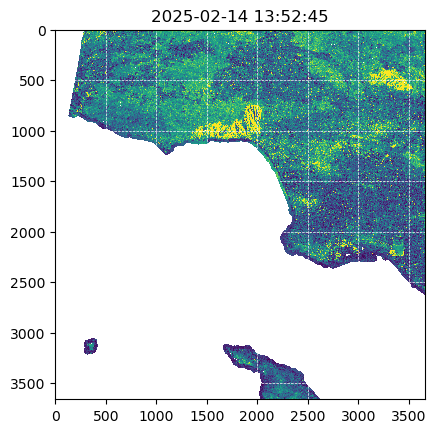

In [8]:
plt.imshow(metrics[-1], vmin=0, vmax=4, interpolation='none')
plt.title(f'{dates[-1]}')
plt.grid(True, color='white', linestyle='--', linewidth=0.5)
plt.show()

### Configure plot subset and display value range.  

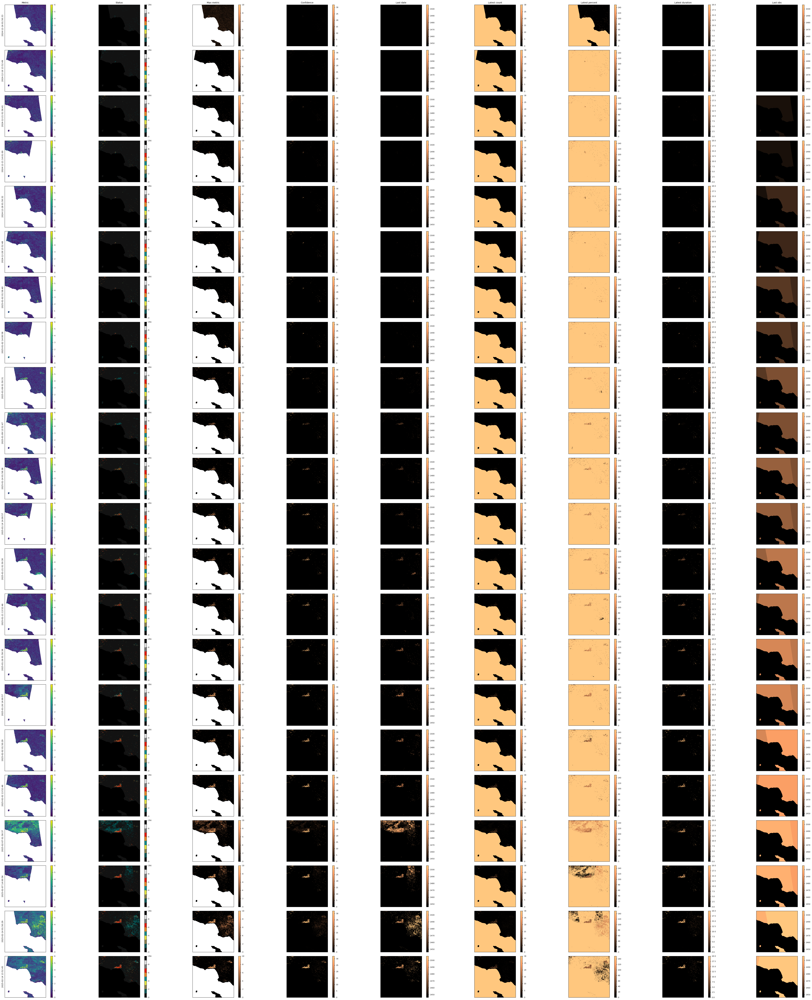

In [9]:
# Define subset for plotting
# s = np.s_[500:1500, 1000:2000] # set subset here as [ymin:ymax, xmin:xmax].
s = np.s_[:,:] # uncomment to plot full extent. 

# Adjust to improve visualization
custom_ranges = [
    (0, 6),          # Metric
    (0, 10),          # Status
    (0, 10),         # Max metric
    (0, 32),         # Confidence
    (day_start, day_end), # Last date
    (0, 30),         # Count
    (0, 150),         # Percent
    (0, 20),         # Duration
    (day_start, day_end),  # Last obs
]

plot_disturbance_results_with_metric(results, metrics, subset=s, value_ranges=custom_ranges, dates=dates)

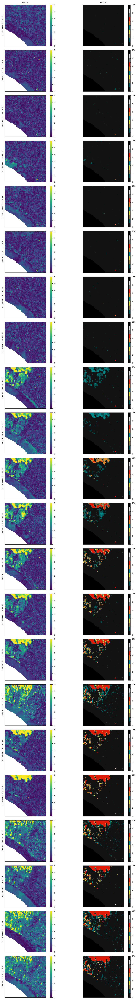

In [10]:
s = np.s_[1000:1200, 1900:2100] # set subset here as [ymin:ymax, xmin:xmax].
plot_disturbance_results_with_metric(results, metrics, subset=s, value_ranges=custom_ranges, dates=dates, panels=["Metric", "Status"])

### Run confirmation using `process_disturbance_alert` function that mimics the one in Dist-S1 and plot.

This is a first product tile with date 2024-12-16 01:50:33


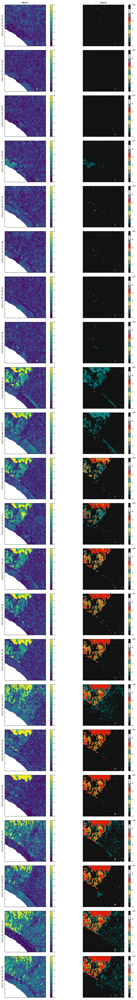

In [11]:
# Assuming dist_metric_list and dist_date_list are defined
confirmed_metrics = run_metric_ts_confirmation(metrics, dates)
plot_disturbance_results_with_metric(confirmed_metrics, metrics, subset=s, value_ranges=custom_ranges, dates=dates, panels=["Metric", "Status"])